____
# TEST TILT
____

## Plan d'attaque

1. Générer une particule et l'augmenter, en choisissant les angles de rotation.
2. Choisir une bonne labellisation (top, side, other) en fonctions des angles.
3. Vérifier sur une image complète.

In [2]:
import os
os.chdir('/home/plumail/stage/minisource')
import torch
import numpy as np
from typing import Tuple, List
import matplotlib.pyplot as plt

___
# I - GENERATE AND AUGMENT PARTICLE
___

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
point_cloud_path = '/data1/stage_Luc/inputs/sample_centriole_point_cloud.csv'

In [7]:
point_cloud = np.loadtxt(point_cloud_path, delimiter=',')
point_cloud = torch.as_tensor(point_cloud, dtype=torch.float64).to(device)
print(f"Point Cloud Shape: {list(point_cloud.shape)}")

Point Cloud Shape: [89991, 3]


> Les détails de cette partie sont décris dans **particle.ipynb**.

## 1. Augment Point Cloud

In [8]:
from scipy.spatial.transform import Rotation
import modules.pretraining.generate.functional as F

On n'utilise pas la rotation dans **F** mais on la réécrie pour pouvoir choisir les angles.

In [9]:
def augment_point_cloud(
    point_cloud: torch.Tensor,
    shrink_range: Tuple[int],
    rotation_angles: Tuple[float],
    intensity_nb_holes_min: int,
    intensity_nb_holes_max: int,
    intensity_mean_ratio: float,
    intensity_std_ratio_range: Tuple[int],
    device: torch.device,
) -> torch.Tensor:
    # 1. Shrink
    a, b   = shrink_range
    factor = (b - a) * np.random.random_sample() + a
    point_cloud = F.shrink(point_cloud, factor)
    # 2. Rotate
    rot = Rotation.from_euler('zxz', rotation_angles, degrees=True)
    rot_mat = torch.as_tensor(rot.as_matrix(), dtype=torch.float64).to(device)
    point_cloud = (rot_mat @ point_cloud.T).T
    # 3. Simulate non uniform density
    a, b = intensity_std_ratio_range
    std_ratio = (b - a) * np.random.random_sample() + a
    holes_args = [intensity_nb_holes_min, intensity_nb_holes_max, intensity_mean_ratio, std_ratio]
    point_cloud = F.non_uniform_density(point_cloud, *holes_args, device)
    return point_cloud

In [10]:
shrink_range   = (2, 3)

rotation_angles = (0, 0, 0)

intensity_nb_holes_min    = 7
intensity_nb_holes_max    = 8
intensity_mean_ratio      = 0.35
intensity_std_ratio_range = (0.15, 0.25)

augment_args = [
    shrink_range, rotation_angles, intensity_nb_holes_min, intensity_nb_holes_max,
    intensity_mean_ratio, intensity_std_ratio_range
]

In [11]:
point_cloud = augment_point_cloud(point_cloud, *augment_args, device)

## 2. Voxelize and further augment

In [12]:
from scipy.ndimage.filters import gaussian_filter
from modules.pretraining.generate.figtree.pyfigtree import figtree

/tmp/ipykernel_13194/3576674970.py:1: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


In [13]:
def image_from_pointcloud(
    point_cloud: np.ndarray,
    max_particle_dim: int,
    bandwidth: float=15,
    epsilon: float=1e-2
) -> np.ndarray:
    x_min, x_max, y_min, y_max, z_min, z_max = F.get_FOV(point_cloud)
    max_delta = max(x_max - x_min, y_max - y_min, z_max - z_min)
    step = max_delta / max_particle_dim
    x_range = int(np.ceil((x_max - x_min) / step))
    y_range = int(np.ceil((y_max - y_min) / step))
    z_range = int(np.ceil((z_max - z_min) / step))
    target_points = np.mgrid[x_min:x_max:step, y_min:y_max:step, z_min:z_max:step]
    target_points = target_points.reshape(3, -1).T
    weights = np.ones(len(point_cloud))
    densities = figtree(point_cloud, target_points, weights, bandwidth=bandwidth, epsilon=epsilon)
    densities = densities.reshape((x_range, y_range, z_range))
    densities = densities.transpose(2, 0, 1)
    densities = (densities - densities.min()) / (densities.max() - densities.min())
    return densities

In [14]:
max_particle_dim = 100 # max voxel dim

In [15]:
image = image_from_pointcloud(point_cloud.cpu().numpy(), max_particle_dim)

Pour voir ce qu'il se passe d'un peu plus loin je place la particule au milieu d'un plus grand cube. 

In [16]:
image = np.pad(image, 50, mode='constant')

In [17]:
def add_gaussian_noise_with_target_snr(
    image: np.ndarray,
    mean: float,
    target_snr_db: int
) -> np.ndarray:
    image_average_db = 10 * np.log10(image.mean())
    noise_average_db = image_average_db - target_snr_db
    noise_average    = 10 ** (noise_average_db / 10)
    noise = np.random.normal(mean, np.sqrt(noise_average), image.shape)
    image += noise
    return (image - image.min()) / (image.max() - image.min())

In [18]:
from skimage.util import random_noise

In [19]:
def add_poisson_noise(image: np.ndarray) -> np.ndarray:
    return random_noise(image, "poisson")

Je rends les bruit gaussien et de Poisson optionnels parce qu'on veut pouvoir bien voir la particule donc il ne faut pas nécessairement la bruiter.

In [20]:
def augment_image(
    image: np.ndarray,
    sigma: Tuple[int],
    mode: str,
    gaussian_noise: bool,
    mean: float,
    target_snr_db: int,
    poisson_noise: bool,
) -> np.ndarray:
    image = gaussian_filter(image, sigma=sigma, mode=mode)
    if gaussian_noise:
        image = add_gaussian_noise_with_target_snr(image, mean, target_snr_db)
    if poisson_noise:
        image = add_poisson_noise(image)
    return image

In [21]:
sigma = (5, 1, 1)   # strong z-axis resolution anisotropy.
mode  = 'constant'

gaussian_noise = True
poisson_noise  = True
mean = 0.5
target_snr_db = 30  # very good SNR for good view 

In [22]:
image = augment_image(image, sigma, mode, gaussian_noise, mean, target_snr_db, poisson_noise)

La génération et l'augmentation sont maintenant terminées.

In [23]:
print('Shape.: ', image.shape)
print('Angles: ', rotation_angles)

Shape.:  (200, 151, 151)
Angles:  (0, 0, 0)


On peut s'intéresser à la labellisation de la vue. Cette labellisation se fait évidemment par rapport à une position de caméra de référence donc on ne visualize que suivant cette position.

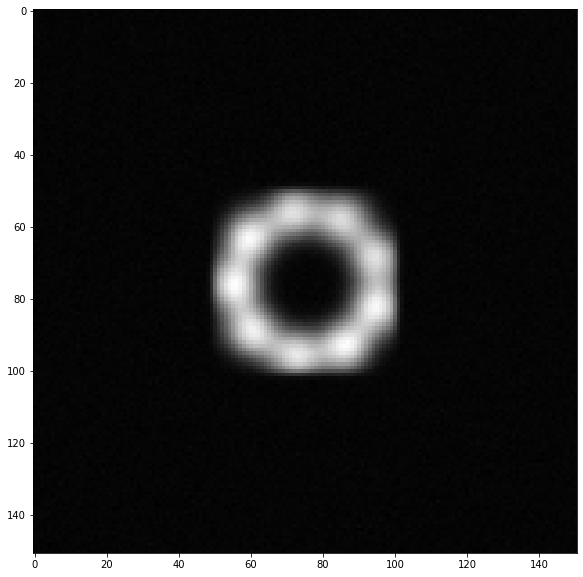

In [24]:
plt.figure(figsize=(10, 10))
plt.imshow(image[image.shape[0] // 2], cmap='gray')
plt.show()

___
# II - CHOOSE LABELIZATION FROM ROTATION ANGLES
___

Pour des essais plus pratique, je vais wrapper les différentes étapes après la rotation dans une fonction.

In [25]:
def load_point_cloud(path: str) -> torch.Tensor:
    point_cloud = np.loadtxt(point_cloud_path, delimiter=',')
    return torch.as_tensor(point_cloud, dtype=torch.float64).to(device)

In [27]:
def wrapper_generate(
    point_cloud: torch.Tensor,
    shrink_range: Tuple[int],
    intensity_nb_holes_min: int,
    intensity_nb_holes_max: int,
    intensity_mean_ratio: float,
    intensity_std_ratio_range: Tuple[int],
    max_particle_dim: int,
    bandwidth: float,
    epsilon: float,
    sigma: Tuple[int],
    mode: str,
    gaussian_noise: bool,
    mean: float,
    target_snr_db: int,
    poisson_noise: bool,
    device: torch.device,
    rotation_angles: Tuple[float],
    pad: int=50,
) -> np.ndarray:
    # 1. Augment point cloud
    augment_args = [
        shrink_range, rotation_angles, intensity_nb_holes_min, intensity_nb_holes_max,
        intensity_mean_ratio, intensity_std_ratio_range
    ]
    point_cloud = augment_point_cloud(point_cloud, *augment_args, device)
    # 2. Voxelize
    image = image_from_pointcloud(point_cloud.cpu().numpy(), max_particle_dim)
    # 3. Pad
    image = np.pad(image, pad, mode='constant')
    # 4. Augment image
    image = augment_image(image, sigma, mode, gaussian_noise, mean, target_snr_db, poisson_noise)
    return image

In [28]:
bandwidth, epsilon = 20, 1e-3

In [29]:
image = wrapper_generate(
    load_point_cloud(point_cloud_path),
    shrink_range,
    intensity_nb_holes_min,
    intensity_nb_holes_max,
    intensity_mean_ratio,
    intensity_std_ratio_range,
    max_particle_dim,
    bandwidth,
    epsilon,
    sigma,
    mode,
    gaussian_noise,
    mean,
    target_snr_db,
    poisson_noise,
    device,
    rotation_angles,
)

Enfin, on va encore se simplifier les choses un peu plus en faisant une fonction des angles uniquement et en fixant le reste.

In [30]:
from functools import partial

In [31]:
wrapper_generate_from_rotate = partial(wrapper_generate, 
    load_point_cloud(point_cloud_path),
    shrink_range,
    intensity_nb_holes_min,
    intensity_nb_holes_max,
    intensity_mean_ratio,
    intensity_std_ratio_range,
    max_particle_dim,
    bandwidth,
    epsilon,
    sigma,
    mode,
    gaussian_noise,
    mean,
    target_snr_db,
    poisson_noise,
    device,
    pad=50
)

In [32]:
rotation_angles = (0, 0, 0)

In [33]:
# image = wrapper_generate_from_rotate(rotation_angles)

Les angles d'Euler s'appliquent séquentiellement:
- le premier tourne autour de l'axe z (l'axe du centriole pour une top view) (donc ça reste une top view)
- le deuxième tourne autour de l'axe x ou y (suivant les conventions) (donc si il est égal à 90° ça devient une side view, à 0 ou 180 ça reste une top)
- le troisième tourne autour du nouvel axe z

C'est donc le 2ème angle d'Euler qui détermine la vue.

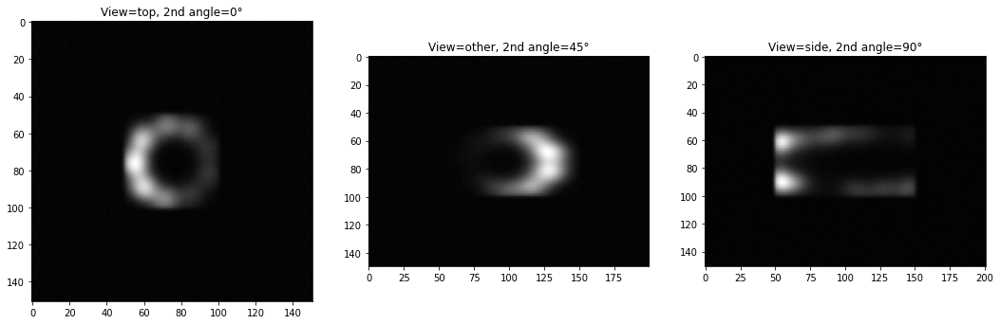

In [34]:
views = ('top', 'other', 'side')
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
for i in range(3):
    rotation_angles = (0, i * 45, 0)
    image = wrapper_generate_from_rotate(rotation_angles)
    ax[i].imshow(image[image.shape[0] // 2], cmap='gray')
    ax[i].set_title(f'View={views[i]}, 2nd angle={i * 45}°')
    ax[i].grid(False)
plt.show()

Reste à déteminer les valeurs limites. On va déterminer une valeure minimale et maximale pour la top view et pour la side view, tout le reste étant "other".

### Top view extremum values

In [35]:
margin = 25

In [36]:
# Top view = (0 +- margin) OR (180 - margin)

angles = (
    0 - margin,
    0 + margin,
    180 - margin,
    180 + margin
)

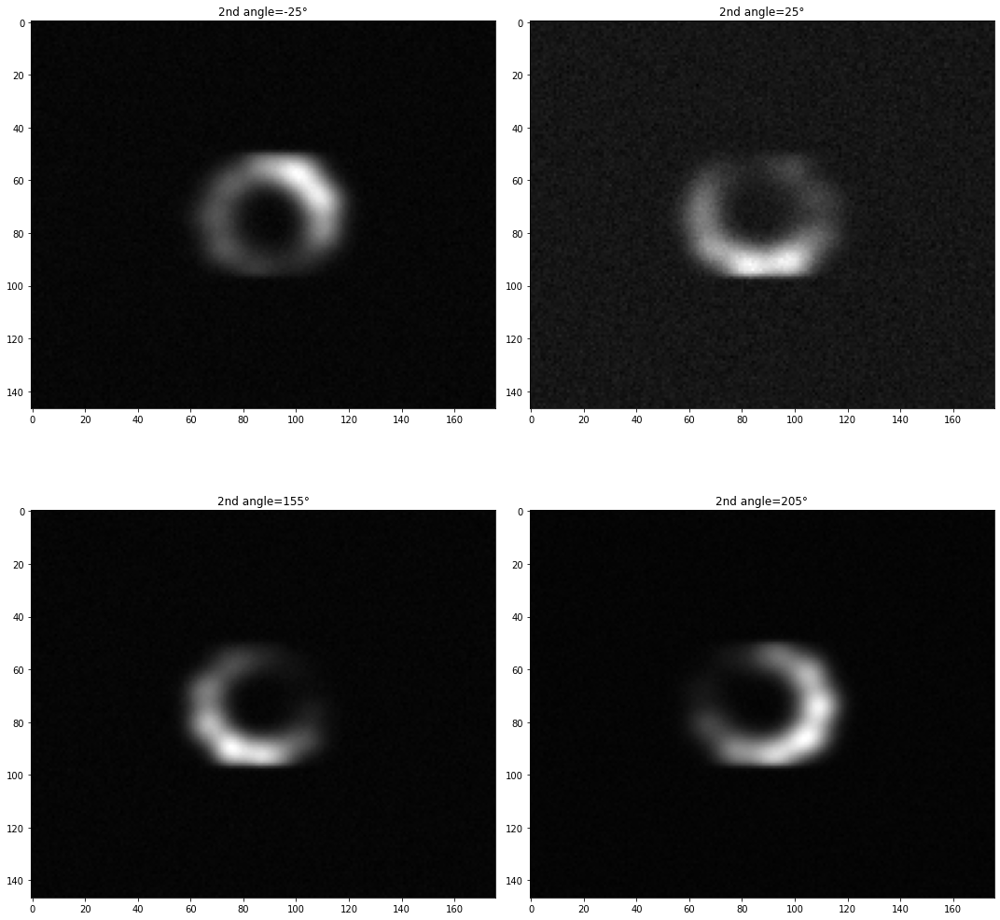

In [37]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))
for i, angle in enumerate(angles):
    rotation_angles = (0, angle, 0)
    image = wrapper_generate_from_rotate(rotation_angles)
    ax[i // 2, i % 2].imshow(image[image.shape[0] // 2], cmap='gray')
    ax[i // 2, i % 2].set_title(f'2nd angle={angle}°')
    ax[i // 2, i % 2].grid(False)
plt.tight_layout()
plt.show()

### Side view extremum values

In [38]:
margin = 25

In [39]:
# Side view = (90 +- margin) OR (270 +- margin)

angles = (
    90 - margin,
    90 + margin,
    270 - margin,
    270 + margin
)

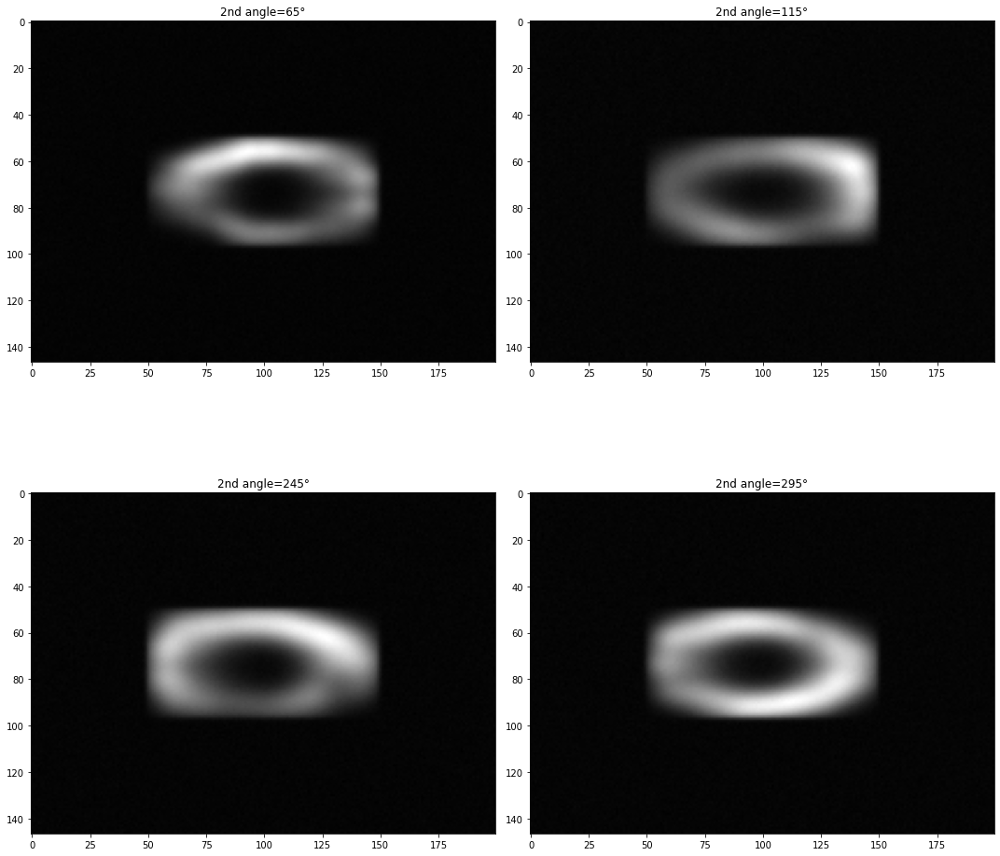

In [40]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))
for i, angle in enumerate(angles):
    rotation_angles = (0, angle, 0)
    image = wrapper_generate_from_rotate(rotation_angles)
    ax[i // 2, i % 2].imshow(image[image.shape[0] // 2], cmap='gray')
    ax[i // 2, i % 2].set_title(f'2nd angle={angle}°')
plt.tight_layout()
plt.show()

In [41]:
def get_view_from_angles(angles: Tuple[int], margin: int=0) -> int:
    angle = angles[1]
    if ((0 - margin) <= angle <= (0 + margin)) or ((180 - margin) <= angle <= (180 + margin)):
        return 0   # TOP
    if ((90 - margin) <= angle <= (90 + margin)) or ((270 - margin) <= angle <= (270 + margin)):
        return 1   # SIDE
    return 2       # OTHER

___
# TEST FULL IMAGE
___

On va procéder comme suit: 

1. Générer les positions des particules.
2. Les placer et les augmenter en retenant les angles de rotations (en utilisant les wrappers créés plus haut).
3. Labelliser les particules en fonctions des angles de rotations.

## 1. Generate centers

In [42]:
from scipy.stats import truncnorm

In [43]:
def generate_centers_one_cluster(
    target_shape: Tuple[int],
    cluster_range_xy: Tuple[int],
    cluster_range_z: Tuple[int],
    nb_particles_per_cluster_range: Tuple[int],
    max_particle_dim: int,
    remaining_particles: int,
    deterministic: bool
) -> np.ndarray:
    radius_xy_min, radius_xy_max = cluster_range_xy
    radius_z_min,  radius_z_max  = cluster_range_z
    radius_xy = np.random.randint(radius_xy_min, high=radius_xy_max, size=2)
    radius_z  = np.random.randint(radius_z_min,  high=radius_z_max)
    margin    = radius_xy + max_particle_dim
    center_xy = np.random.randint(margin, high=np.array(target_shape[1:]) - margin)
    margin    = radius_z + max_particle_dim
    center_z  = np.random.randint(margin,  high=np.array(target_shape[0]) - margin)
    center    = (center_z, *center_xy)
    radius    = (radius_z, *radius_xy)
    if deterministic:
        nb_particles = remaining_particles
    else:
        nb_min, nb_max = nb_particles_per_cluster_range
        nb_max = min(nb_max, remaining_particles)
        nb_particles = np.random.randint(nb_min, high=nb_max + 1)
    margin = np.array(3 * (max_particle_dim, ))
    clip_min, clip_max = (margin - center) / radius, (target_shape - margin - center) / radius
    truncnorm_kwargs = {'loc': center, 'scale': radius, 'size': (nb_particles, 3)}
    centers = truncnorm.rvs(clip_min, clip_max, **truncnorm_kwargs)
    return centers.astype(np.uint16)


def generate_centers(
    target_shape: Tuple[int],
    cluster_range_xy: Tuple[int],
    cluster_range_z: Tuple[int],
    nb_particles_per_cluster_range: Tuple[int],
    max_particle_dim: int,
    num_particles: int,
) -> np.ndarray:
    total_nb_to_generate = num_particles
    remaining_number_to_generate = num_particles
    all_centers = np.ndarray((0, 3), dtype=np.uint16)
    min_nb_particles_per_cluster = nb_particles_per_cluster_range[0]
    while remaining_number_to_generate > 0:
        deterministic = (remaining_number_to_generate < min_nb_particles_per_cluster)
        centers = generate_centers_one_cluster(
            target_shape,
            cluster_range_xy,
            cluster_range_z,
            nb_particles_per_cluster_range,
            max_particle_dim,
            remaining_number_to_generate,
            deterministic
        )
        all_centers = np.vstack((all_centers, centers))
        # border  = np.array(target_shape) - max_particle_dim
        # all_centers = all_centers[(all_centers < border).all(axis=1)]
        remaining_number_to_generate = total_nb_to_generate - all_centers.shape[0]
    return all_centers

In [44]:
target_shape     = (128, 1024, 1024)
cluster_range_xy = (100, 400)
cluster_range_z  = (5,  20)
max_particle_dim = 25
num_particles    = 150
nb_particles_per_cluster_range = (5,  15)

In [45]:
centers = generate_centers(
    target_shape,
    cluster_range_xy,
    cluster_range_z,
    nb_particles_per_cluster_range,
    max_particle_dim,
    num_particles
)

In [46]:
wrapper_generate_centers = partial(
    generate_centers,
    target_shape,
    cluster_range_xy,
    cluster_range_z,
    nb_particles_per_cluster_range,
    max_particle_dim,   
)

## 2. Generate image

In [47]:
from tqdm import tqdm

Je redéfinis le wrapper ici au cas où je veux changer un paramètre ici. 

In [48]:
gaussian_noise   = False
poisson_noise    = False
target_snr_db    = 15
max_particle_dim = 25

In [49]:
wrapper_generate_from_rotate = partial(wrapper_generate, 
    load_point_cloud(point_cloud_path),
    shrink_range,
    intensity_nb_holes_min,
    intensity_nb_holes_max,
    intensity_mean_ratio,
    intensity_std_ratio_range,
    max_particle_dim,
    bandwidth,
    epsilon,
    sigma,
    mode,
    gaussian_noise,
    mean,
    target_snr_db,
    poisson_noise,
    device,
    pad=0
)

In [50]:
def create_image(num_particles: int, margin: int) -> np.ndarray:
    image   = np.zeros(target_shape)
    centers = wrapper_generate_centers(num_particles)
    angles  = np.random.uniform(low=0, high=360, size=(num_particles, 3))
    wrapper_get_view_from_angles = partial(get_view_from_angles, margin=margin)
    views = list(map(wrapper_get_view_from_angles, angles))
    for center, angles_triplet in tqdm(zip(centers, angles), total=num_particles):
        particle = wrapper_generate_from_rotate(angles_triplet)
        depth, height, width = particle.shape
        z, y, x = center
        z_min, y_min, x_min = z - depth // 2, y - height // 2, x - width // 2
        z_max, y_max, x_max = z_min + depth, y_min + height, x_min + width
        image[z_min:z_max, y_min:y_max, x_min:x_max] += particle
        # image[z_min:z_max, y_min:y_max, x_min:x_max] = block + particle
    image = augment_image(image, sigma, mode, True, mean, target_snr_db // 2, True)
    return image, centers, views

In [51]:
margin = 25

In [52]:
image, centers, views = create_image(num_particles, margin)

100%|██████████| 150/150 [00:39<00:00,  3.82it/s]


In [53]:
from matplotlib.patches import Rectangle

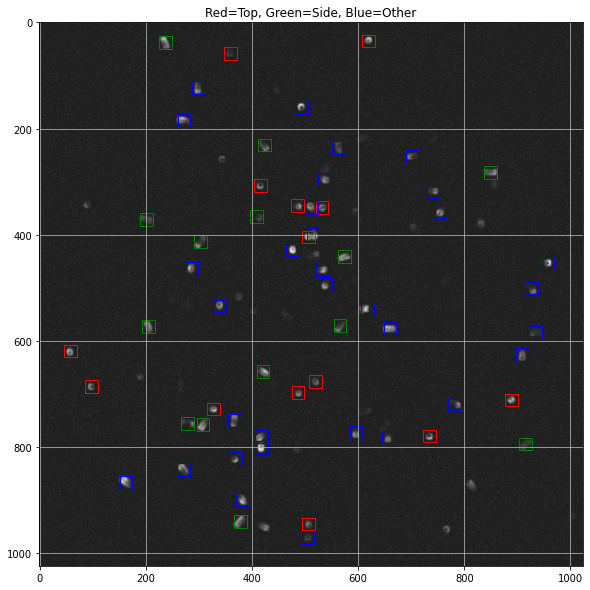

In [54]:
size = 24
slice_index = 64

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(image[slice_index], cmap='gray')
kwargs = {'fill': False, 'linestyle': 'solid', 'linewidth': 1}
colors = ['red', 'green', 'blue']
for center, view in zip(centers, views):
    z, y, x = center
    if z - size // 2 < slice_index < z + size // 2:
        kwargs['color'] = colors[view]
        ax.add_patch(Rectangle((x - size // 2, y - size // 2), size, size, **kwargs))
ax.set_title('Red=Top, Green=Side, Blue=Other')
plt.grid(True)
plt.show()

___
# VIEWS
___


En pratique, quand on génère et place les particules sur une image, on veut qu'il y ait une majorité de top et side view (autant l'une que l'autre), et une minorité de other. Pour cela on sample le 2nd angle d'Euler suivant un mélange de 4 gaussiennes (0 et 180 pour top, 90 et 270 pour side).

In [55]:
plt.rcParams["axes.prop_cycle"].by_key()["color"]

['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

In [56]:
margin = 10

In [57]:
colors = ['#FFCB7D', '#B58A47', '#694714', '#4682B4', '#7DC4FF', '#1E4769']
red, green, blue = '#B55C59', '#B0B535', '#4682B4'

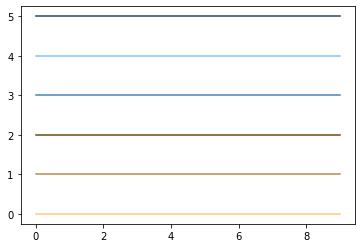

In [58]:
fig, ax = plt.subplots()
for i in range(6):
    ax.plot(10 * [i], color=colors[i])
plt.show()

In [59]:
import numpy.random as R

distributions = {}
distributions['gaussian_top_side_only'] = [
    {"type": R.normal, "kwargs": {"loc":   0, "scale": 10}},
    {"type": R.normal, "kwargs": {"loc":  90, "scale": 10}},
    {"type": R.normal, "kwargs": {"loc": 180, "scale": 10}},
    {"type": R.normal, "kwargs": {"loc": 270, "scale": 10}},
]
distributions['uniform_top_side_only'] = [
    {"type": R.uniform, "kwargs": {"low":   0 - margin, "high":   0 + margin}},
    {"type": R.uniform, "kwargs": {"low":  90 - margin, "high":  90 + margin}},
    {"type": R.uniform, "kwargs": {"low": 180 - margin, "high": 180 + margin}},
    {"type": R.uniform, "kwargs": {"low": 270 - margin, "high": 270 + margin}},
]
distributions['uniform'] = [
    # top and side
    {"type": R.uniform, "kwargs": {"low":   0 - margin, "high":   0 + margin}},
    {"type": R.uniform, "kwargs": {"low":  90 - margin, "high":  90 + margin}},
    {"type": R.uniform, "kwargs": {"low": 180 - margin, "high": 180 + margin}},
    {"type": R.uniform, "kwargs": {"low": 270 - margin, "high": 270 + margin}},
    # other
    {"type": R.uniform, "kwargs": {"low":   0 + 2 * margin, "high":  90 - 2 * margin}},
    {"type": R.uniform, "kwargs": {"low":  90 + 2 * margin, "high": 180 - 2 * margin}},
    {"type": R.uniform, "kwargs": {"low": 180 + 2 * margin, "high": 270 - 2 * margin}},
]
distributions['gaussian'] = [
    # top and side
    {"type": R.normal, "kwargs": {"loc":   0, "scale": margin // 2}},
    {"type": R.normal, "kwargs": {"loc":  90, "scale": margin // 2}},
    {"type": R.normal, "kwargs": {"loc": 180, "scale": margin // 2}},
    {"type": R.normal, "kwargs": {"loc": 270, "scale": margin // 2}},
    # other
    {"type": R.normal, "kwargs": {"loc":   45, "scale":  margin}},
    {"type": R.normal, "kwargs": {"loc":  135, "scale":  margin}},
    {"type": R.normal, "kwargs": {"loc":  225, "scale":  margin}},
]

In [60]:
tilt_strategy = 'uniform'

In [61]:
distributions = distributions[tilt_strategy]

weights = np.ones((len(distributions)))
# weights = np.array([1.0, 1.0, 1.0, 1.0])
weights /= weights.sum()

sample_size = 500000
num_distr = len(distributions)

data = np.zeros((sample_size, num_distr))
for idx, distr in enumerate(distributions):
    data[:, idx] = distr["type"](size=(sample_size, ), **distr["kwargs"])
random_idx = np.random.choice(np.arange(num_distr), size=(sample_size, ), p=weights)
sample = data[np.arange(sample_size), random_idx]

In [62]:
plt.style.use('seaborn')
plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=20, weight='light')
plt.rc('legend', fontsize=15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=20)
plt.rc('figure', dpi=1200)


fig, ax = plt.subplots()
ax.hist(sample, bins=200, density=True, alpha=0.7, color=blue)
# top view
# ax.vlines([0, 180], 0, 0.010, color='#C44E52')
# ax.vlines([0-margin, 0+margin, 180-margin, 180+margin], 0, 0.010, color='red')
ax.axvspan(0-margin, 0+margin, alpha=0.3, color='red')
ax.axvspan(180-margin, 180+margin, alpha=0.3, color='red', label='top')
# side view
# ax.vlines([90, 270], 0, 0.010, color='green')
# ax.vlines([90-margin, 90+margin, 270-margin, 270+margin], 0, 0.010, color='green')
ax.axvspan(90-margin, 90+margin, alpha=0.3, color='green')
ax.axvspan(270-margin, 270+margin, alpha=0.3, color='green', label='side')

ax.set_xlabel('Angle en degré')
ax.set_ylabel('Densité')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=2)
plt.show()
fig.savefig(f'tilt_{tilt_strategy}.svg', format='svg', dpi=1200, bbox_inches='tight')

In [63]:
colors = ['#FFCB7D', '#B58A47', '#694714', '#4682B4', '#7DC4FF', '#1E4769']

In [64]:
distributions = [
    # top and side
    {"type": np.random.normal, "kwargs": {"loc":   0, "scale": margin // 2}},
    {"type": np.random.normal, "kwargs": {"loc":  90, "scale": margin // 2}},
    {"type": np.random.normal, "kwargs": {"loc": 180, "scale": margin // 2}},
    {"type": np.random.normal, "kwargs": {"loc": 270, "scale": margin // 2}},
    # other
    {"type": np.random.normal, "kwargs": {"loc":   45, "scale":  margin}},
    {"type": np.random.normal, "kwargs": {"loc":  135, "scale":  margin}},
    {"type": np.random.normal, "kwargs": {"loc":  225, "scale":  margin}},
]

sample_size = 500000
num_distr = len(distributions)

weights = np.ones((num_distr))
weights /= weights.sum()

data = np.zeros((sample_size, num_distr))
for idx, distr in enumerate(distributions):
    data[:, idx] = distr["type"](size=(sample_size, ), **distr["kwargs"])
random_idx = np.random.choice(np.arange(num_distr), size=(sample_size, ), p=weights)
sample = data[np.arange(sample_size), random_idx]

plt.style.use('seaborn')
plt.figure(figsize=(20, 10))
plt.hist(sample, bins=200, density=True, alpha=0.7)
# top view
plt.vlines([0, 180], 0, 0.010, color='#C44E52')
plt.vlines([0-margin, 0+margin, 180-margin, 180+margin], 0, 0.010, color='#C44E52')
plt.axvspan(0-margin, 0+margin, alpha=0.5, color='#C44E52')
plt.axvspan(180-margin, 180+margin, alpha=0.5, color='#C44E52', label='top')
# side view
plt.vlines([90, 270], 0, 0.010, color='green')
plt.vlines([90-margin, 90+margin, 270-margin, 270+margin], 0, 0.010, color='green')
plt.axvspan(90-margin, 90+margin, alpha=0.3, color='green')
plt.axvspan(270-margin, 270+margin, alpha=0.3, color='green', label='side')


plt.legend()
plt.show()

In [65]:
def get_view_from_2nd_angle(angle: float, margin: int=0) -> int:
    if ((0 - margin) <= angle <= (0 + margin)) or ((180 - margin) <= angle <= (180 + margin)):
        return 0   # TOP
    if ((90 - margin) <= angle <= (90 + margin)) or ((270 - margin) <= angle <= (270 + margin)):
        return 1   # SIDE
    return 2       # OTHER

In [66]:
wrapper_get_view_from_2nd_angle = partial(get_view_from_2nd_angle, margin=margin)
views = np.array(list(map(wrapper_get_view_from_2nd_angle, sample)))

In [67]:
print(len(views[views == 0]) / sample_size)
print(len(views[views == 1]) / sample_size)
print(len(views[views == 2]) / sample_size)

0.271882
0.272638
0.45548


In [68]:
def sample_tilt_angles(num_particles: int) -> List:
    distributions = [
        {"type": np.random.normal, "kwargs": {"loc":   0, "scale": 10}},
        {"type": np.random.normal, "kwargs": {"loc":  90, "scale": 10}},
        {"type": np.random.normal, "kwargs": {"loc": 180, "scale": 10}},
        {"type": np.random.normal, "kwargs": {"loc": 270, "scale": 10}},
    ]
    weights = np.array([1.0, 1.0, 1.0, 1.0])
    weights /= weights.sum()
    num_distributions = len(distributions)
    data = np.zeros((num_particles, num_distributions))
    for idx, distr in enumerate(distributions):
        data[:, idx] = distr["type"](size=(num_particles, ), **distr["kwargs"])
    random_idx = np.random.choice(np.arange(num_distributions), size=(num_particles, ), p=weights)
    return data[np.arange(num_particles), random_idx]

In [69]:
test = np.array(sample_tilt_angles(150))
views = np.array(list(map(wrapper_get_view_from_2nd_angle, test)))

In [70]:
print(len(views[views == 0]))
print(len(views[views == 1]))
print(len(views[views == 2]))

41
59
50


On intégre cette fonction à la fonction de création d'image.

In [71]:
def generate_angles(num_particles: int) -> np.ndarray:
    tilt_angles  = sample_tilt_angles(num_particles)
    other_angles = np.random.uniform(low=0, high=360, size=(num_particles, 2))
    return np.vstack((other_angles[:, 0], tilt_angles, other_angles[:, 1])).T

In [72]:
def create_image(num_particles: int, margin: int) -> np.ndarray:
    image   = np.zeros(target_shape)
    centers = wrapper_generate_centers(num_particles)
    angles  = generate_angles(num_particles)
    wrapper_get_view_from_angles = partial(get_view_from_angles, margin=margin)
    views = np.array(list(map(wrapper_get_view_from_angles, angles)))
    for center, angles_triplet in tqdm(zip(centers, angles), total=num_particles):
        particle = wrapper_generate_from_rotate(angles_triplet)
        depth, height, width = particle.shape
        z, y, x = center
        z_min, y_min, x_min = z - depth // 2, y - height // 2, x - width // 2
        z_max, y_max, x_max = z_min + depth, y_min + height, x_min + width
        image[z_min:z_max, y_min:y_max, x_min:x_max] += particle
    image = augment_image(image, sigma, mode, True, mean, target_snr_db // 2, True)
    return image, centers, views

In [73]:
margin = 10

In [74]:
image, centers, views = create_image(num_particles, margin)

100%|██████████| 150/150 [00:36<00:00,  4.12it/s]


In [75]:
print(len(views[views == 0]))
print(len(views[views == 1]))
print(len(views[views == 2]))

54
56
40


In [76]:
size = 24
slice_index = 64

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(image[slice_index], cmap='gray')
kwargs = {'fill': False, 'linestyle': 'solid', 'linewidth': 1}
colors = ['red', 'green', 'blue']
for center, view in zip(centers, views):
    z, y, x = center
    if z - size // 2 < slice_index < z + size // 2:
        kwargs['color'] = colors[view]
        ax.add_patch(Rectangle((x - size // 2, y - size // 2), size, size, **kwargs))
ax.set_title('Red=Top, Green=Side, Blue=Other')
plt.grid(True)
plt.show()

___
# DRAW & SAVE
___

As a final test, we'll draw the colored-by-view bounding boxes onto the image and save the results as a tiff file.

In [77]:
import imageio
from skimage import img_as_ubyte
from modules.utils import center_to_corners

In [78]:
def grayscale_to_rgb(image: np.ndarray) -> np.ndarray:
    return np.stack((image, ) * 3, axis=-1)

In [79]:
def recenter_if_needed(shape: Tuple[int], corners: np.ndarray) -> Tuple[int]:
    D, H, W = shape
    x_min, y_min, z_min, x_max, y_max, z_max = corners.astype(np.int)
    d, h, w = z_max - z_min, y_max - y_min, x_max - x_min
    z_min, y_min, x_min = max(0, z_min), max(0, y_min), max(0, x_min)
    z_max, y_max, x_max = z_min + d, y_min + h, x_min + w
    z_max, y_max, x_max = min(D, z_max), min(H, y_max), min(W, x_max)
    z_min, y_min, x_min = z_max - d, y_max - h, x_max - w
    return x_min, y_min, z_min, x_max, y_max, z_max

In [80]:
def draw_bbox(image: np.ndarray, bbox: np.ndarray, color: Tuple[int]=(255, 0, 0)) -> None:
    """ Modify image inplace.
    This function draws a 3D bbox to be seen from the z-axis, that is a 2D bbox
    [x_min, x_max, y_min, y_max] at each z in range [z_min, z_max]. 
    """
    x_min, y_min, z_min, x_max, y_max, z_max = recenter_if_needed(image.shape[:3], bbox)
    # bottom square
    image[z_min:z_max, y_min, x_min:x_max] = color
    image[z_min:z_max, y_max, x_min:x_max] = color
    image[z_min:z_max, y_min:y_max, x_min] = color
    image[z_min:z_max, y_min:y_max, x_max] = color

In [81]:
def draw_bboxes(image: np.ndarray, bboxes: np.ndarray, color: Tuple[int]=(255, 0, 0)) -> None:
    """ Modify image inplace. """
    for bbox in bboxes:
        draw_bbox(image, bbox, color)

In [82]:
def save_3d_image_to_tiff(image: np.ndarray, name: str) -> None:
    imageio.mimwrite(f"{name}.tiff", image)

In [83]:
image = grayscale_to_rgb(img_as_ubyte(image))

In [84]:
corners = np.array([center_to_corners(center, size=(24, 24, 24)) for center in centers])

In [85]:
colors = {'red': (255, 0, 0), 'green': (0, 255, 0), 'blue': (0, 0, 255)}

draw_bboxes(image, corners[views == 0], colors['red'])
draw_bboxes(image, corners[views == 1], colors['green'])
draw_bboxes(image, corners[views == 2], colors['blue'])

/tmp/ipykernel_13194/2128634661.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  x_min, y_min, z_min, x_max, y_max, z_max = corners.astype(np.int)


In [86]:
plt.figure(figsize=(20, 10))
plt.imshow(image[64])
plt.show()

In [87]:
save_3d_image_to_tiff(image, 'datasamples/test_annotated_views')